### Alinhamento

In [32]:
import glob
import numpy as np
import cv2
from PIL import Image
import PIL
import imutils
import skimage
from skimage import filters
import pytesseract
from pytesseract import Output
import re
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (11,7)

pytesseract.pytesseract.tesseract_cmd=r'C:\Program Files\Tesseract-OCR\tesseract.exe'

In [33]:
#funcao para cortar parte preta das imagens capturadas pela camera chinesa, pois atrapalham a segmentação
def cropImg(img):
    crop = img[800:1800, 1000:2200]
    return crop

def cropAlign(img):
    crop = img[1020:1630, 1200:2100]
    return crop

def sift_align(img1, img2):
    
    # Converte imagens para cinza
    img1Gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2Gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Detecta recursos SIFT
    sift = cv2.SIFT_create(5000)
    keypoints1, descriptors1 = sift.detectAndCompute(img1Gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2Gray, None)

    # Match features (Recursos de combinações)
    matcher = cv2.DescriptorMatcher_create(cv2.NORM_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Organiza os matches por pontuação
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remova combinações não tão boas
    numGoodMatches = int(len(matches) * 2)
    matches = matches[:numGoodMatches]

    # salva os melhores matches
    imgMatches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches, None)
    cv2.imwrite("matches.jpg", imgMatches)

    # Extrai a localizão do bons matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Encontra homografia
    h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Usa homografia
    height, width, channels = img2.shape
    
    img1Reg = cv2.warpPerspective(img1, h, (width, height))

    return img1Reg, h

def orb_align(img1, img2):
    
    # Converte imagens para cinza
    img1Gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2Gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Detecta recursos SIFT
    orb = cv2.ORB_create(5000)
    keypoints1, descriptors1 = orb.detectAndCompute(img1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(img2Gray, None)

    # Match features (Recursos de combinações)
    matcher = cv2.DescriptorMatcher_create(cv2.NORM_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Organiza os matches por pontuação
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remova combinações não tão boas
    numGoodMatches = int(len(matches) * 2)
    matches = matches[:numGoodMatches]

    # salva os melhores matches
    imgMatches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches, None)
    cv2.imwrite("matches.jpg", imgMatches)

    # Extrai a localizão do bons matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Encontra homografia
    h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Usa homografia
    height, width, channels = img2.shape
    
    img1Reg = cv2.warpPerspective(img1, h, (width, height))

    return img1Reg, h

### Segmentação

In [34]:
def crop_name_seg(img):
    imgcrop = img[100:100+40, 90:90+490] 
    return imgcrop

In [35]:
def gaussianBlurring(img):
    blur1 = cv2.GaussianBlur(img, (5, 5), 0)
    return blur1

In [36]:
def inverte(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    #ret,thresh1 = cv2.threshold(gray,137,255,cv2.THRESH_BINARY)
    ret,thresh2 = cv2.threshold(gray,137,255,cv2.THRESH_BINARY_INV)
    return thresh2

In [37]:
def settozero(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 120, 255, cv2.THRESH_TOZERO)
    return thresh

In [38]:
def conv_edges(img):
    convolution_matrix = np.array([[0,1,0],
                                  [1,-4,1],
                                  [0,1,0]]) #filtro/matriz para detecção de bordas
    edg = cv2.filter2D(img, -1, convolution_matrix)
    return edg

In [39]:
def sharpenFunction(image):
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]) #matriz de convolução que aplica nitidez
    return cv2.filter2D(image, -1, kernel)

In [40]:
def filterFunction(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    (T,Thresh1) = cv2.threshold(gray, 187, 255, cv2.THRESH_TRUNC)
    Thresh2 = cv2.adaptiveThreshold(Thresh1, 255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 231,50)
    return Thresh2

In [41]:
def bilateral(img):
    bil = cv2.bilateralFilter(img, 11, 77, 77) #3, 21, 21 #5, 35, 35 #7, 49, 49 #9, 63, 63 #11, 77, 77
    return bil

In [42]:
def thresholdLocal(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    T = skimage.filters.threshold_local(gray, 11, offset = 10, method = "gaussian")
    imag = (gray > T).astype("uint8") * 255
    return imag

In [43]:
def cleanImage(image, stage = 0):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    # aplicando as operações topHat/blackHat
    topHat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel) #revela as áreas claras com fundo escuro
    blackHat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel) #revela as áreas escuras com um fundo claro
    # fazendo adição e subtração entre as operações morfológicas
    add = cv2.add(gray, topHat)
    subtract = cv2.subtract(add, blackHat)
    if (stage == 1):
        return subtract
    T = filters.threshold_local(subtract, 29, offset=7, method="gaussian", mode="mirror")
    thresh = (subtract > T).astype("uint8") * 255
    if (stage == 2):
        return thresh
    # inverte a imagem 
    thresh = cv2.bitwise_not(thresh)
    return thresh

In [44]:
def find_contours(image):
    contours,hierarchy = cv2.findContours(dilate,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    return contours

### OCR

In [78]:
def data_keys(img):
    d = pytesseract.image_to_data(img, output_type=Output.DICT)
    return d

def drawboxes(img, d):
    
    n_boxes = len(d['text'])
    for i in range(n_boxes):
        if int(d['conf'][i]) > 30:
            #print("Pos x: ", d['left'][i])
            #print("Text: ",d['text'][i])
            if int(d['left'][i]) > 100 and int(d['top'][i]) > 90:
                (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
                img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    return img

def get_datas(img, d):
    #date_pattern = '^(0[1-9]|[12][0-9]|3[01])/(0[1-9]|1[012])/(19|20)\d\d$' # expressão regular para datas
    date_pattern = '\d+/\d+/\d+'
    data_nasc, data_val, data_ph = 0, 0, 0
    n_boxes = len(d['text'])
    for i in range(n_boxes):
        if int(d['conf'][i]) > 40 and int(d['left'][i]) > 100 and int(d['top'][i]) > 100:
            #print(d['text'][i])
            if re.match(date_pattern, d['text'][i]):
                #print(d['text'][i])
                (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
                img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
                if int(d['top'][i]) >= 220 and int(d['top'][i]) <= 320:
                    data_nasc = d['text'][i]
                elif int(d['left'][i]) >= 450 and int(d['left'][i]) <= 650:
                    data_val = d['text'][i]
                elif int(d['left'][i]) >= 640 and int(d['left'][i]) <= 900:
                    data_ph = d['text'][i]
    
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    return data_nasc, data_val, data_ph

def get_cpf(img, d):

    cpf_expr = re.compile('\d{3}\.\d{3}\.\d{3}\-\d{2}')                   

    cpf = 0
    
    n_boxes = len(d['text'])
    for i in range(n_boxes):
        if int(d['conf'][i]) > 40:
            if re.match(cpf_expr, d['text'][i]):
                (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
                img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cpf = d['text'][i]
                
     #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
     #plt.show()
    
    return cpf

#limpa caracteres não ASCII
def cleanup_text(text):
    return "".join([c if ord(c) < 128 else "" for c in text]).strip()

def extraiNome(img):
    crop = img[120:200, 120:850]
    text = pytesseract.image_to_string(crop)
    name = cleanup_text(text)
    name = re.findall('[A-Z]+', name)
    nomecomp = ""
    
    for n in name:
        nomecomp += f" {n}"
    
    res = re.sub("NOME", "", nomecomp)
    
    print("Nome:", res)
    
    return crop

def get_cpf_roi(img):
    
    imgcrop = img[250:320, 420:700]
    text = pytesseract.image_to_string(imgcrop)
    text = cleanup_text(text)
    cpf = ""
    
    cpf = re.findall('[0-9]+', text)
    newcpf = ""
    
    for n in cpf:
        newcpf += f" {n}"
     
    print("CPF:", newcpf)
    #print(text)
    
    return imgcrop

def get_datanasc_roi(img):
    
    imgcrop = img[245:310, 675:860]
    text = pytesseract.image_to_string(imgcrop)
    data = re.findall("\d{2}\/\d{2}\/\d{4}", text)
    strdata = ""
    
    for n in data:
        strdata += f" {n}"
        
    print("Data de nascimento:", strdata)
    
    return imgcrop

def get_nreg_roi(img):
    
    imgcrop = img[520: , 110:420]
    text = pytesseract.image_to_string(imgcrop)
    num = re.findall('[0-9]+', text)
    numreg = ""
    
    for n in num:
        numreg += f" {n}"
        
    print("Número de registro:", numreg)
    
    return imgcrop

def get_dataval_roi(img):
    
    imgcrop = img[530:590, 420:630]
    text = pytesseract.image_to_string(imgcrop)
    data = re.findall('\d{2}/\d{2}/\d{4}', text)
    strdata = ""
    
    for n in data:
        strdata += f" {n}"
    
    print("Validade:", strdata)
    
    return imgcrop

def get_primhab_roi(img):
    
    imgcrop = img[530:600, 630:870]
    text = pytesseract.image_to_string(imgcrop)
    data = re.findall('\d{2}/\d{2}/\d{4}', text)
    strdata = ""
    
    for n in data:
        strdata += f" {n}"
    
    print("Primeira Habilitação:", strdata)
    
    return imgcrop

## TESTES

### Alinhamento

In [46]:
images = glob.glob("../teste1/imgs/*.jpg")
ref = cv2.imread("../teste1/referencias/ref.jpg")
i = 0

for c in images:
    
    img = cv2.imread(c)
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    crop = cropAlign(img)
    cv2.imwrite('../teste1/alinhadas/alinhada%02i.jpg' %i , crop)
    i += 1
    #plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    #s_align,h = sift_align(crop, ref)
    #o_align, h = orb_align(img, ref)
    #plt.imshow(cv2.cvtColor(o_align, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    

### Segmentação + ocr

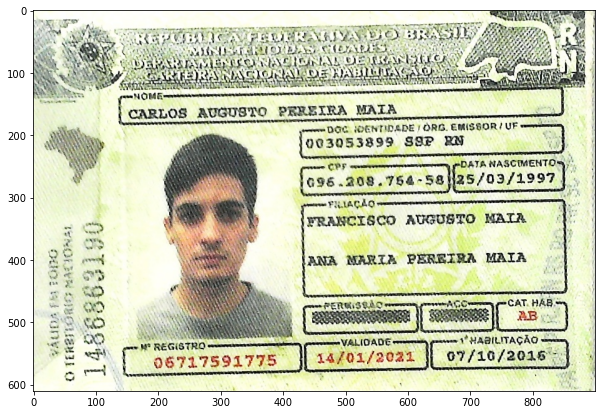


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  CARLOS AUGUSTO PRREIRA MATA D NIIDEDE ORG EMISSOR TUF
CPF:  208 764 58 2 0
Data de nascimento:  25/03/1997
Número de registro: 
Validade: 
Primeira Habilitação:  07/10/2038


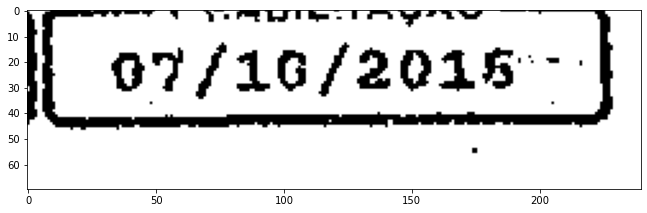


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  CARLOS AUGUSTO PRREIRA MATA TIDADE ORG EISGOR I UF
CPF: 
Data de nascimento:  45/09/1299
Número de registro: 
Validade: 
Primeira Habilitação:  07/10/2019


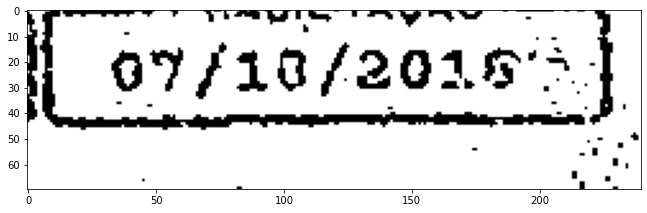


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  CARLOS AUGUSTY PREEINA HALA DOC IDENTIDABE ORG EUISSOR UF
CPF:  8 754 5
Data de nascimento:  25/03/1997
Número de registro:  96727993775
Validade: 
Primeira Habilitação:  07/10/2048


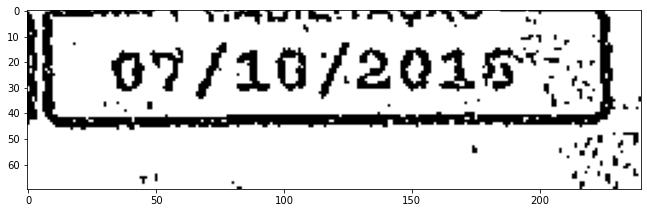

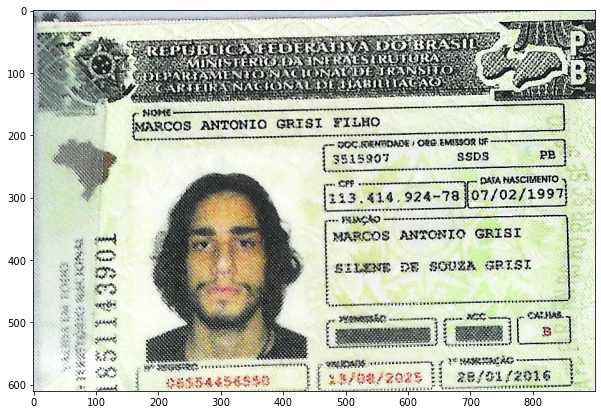


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  HONE ANTONIO GRIST FILHO
CPF: 
Data de nascimento:  07/02/1997
Número de registro: 
Validade: 
Primeira Habilitação: 


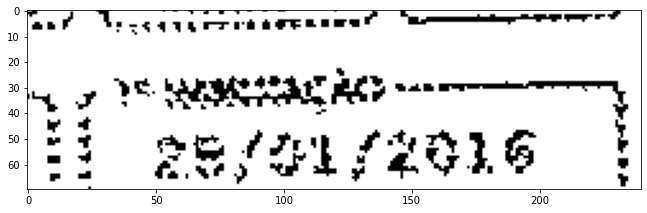


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  HORES ANTONIO GRIST FIL HO
CPF: 
Data de nascimento:  07/02/1997
Número de registro: 
Validade: 
Primeira Habilitação: 


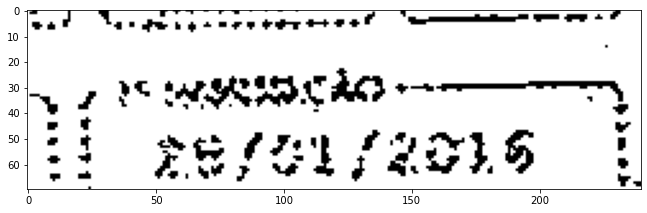


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  ES UREA REEMA RCED B PIEUA SY ERRNO OS SOME ANTONIO GRIST F O
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


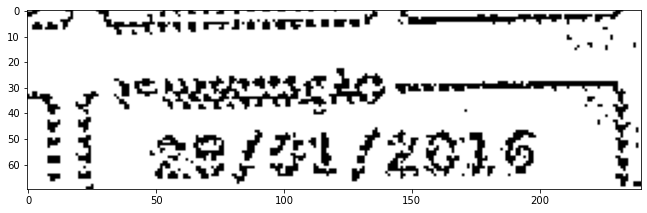

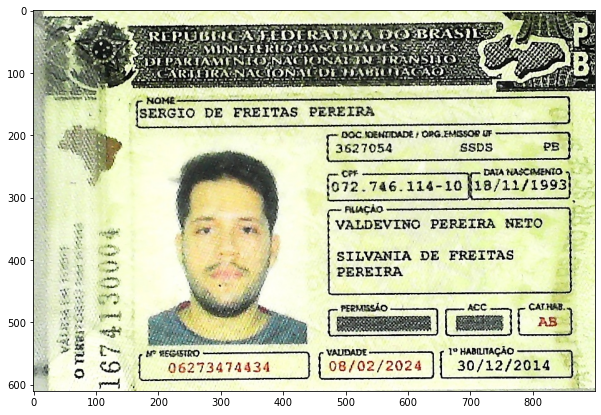


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:   SERGIO DE FREITAS PEREIRA L P PRE CAAMC ED UE
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação:  30/12/2014


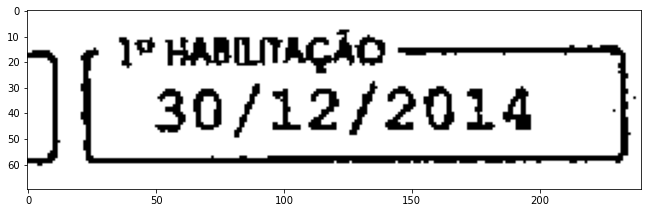


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  NO SERGIO DE FREITAS PEREIRA AO CRED IE
CPF:  072 746 114 10
Data de nascimento:  28/12/1993
Número de registro:  627347 2
Validade: 
Primeira Habilitação:  30/12/2014


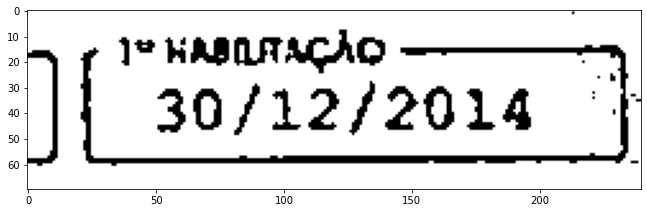


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  DE FRELTAS PERETRA ME PPAR TAR RY CASPASES IME
CPF: 
Data de nascimento: 
Número de registro:  062739474434
Validade: 
Primeira Habilitação:  30/12/2014


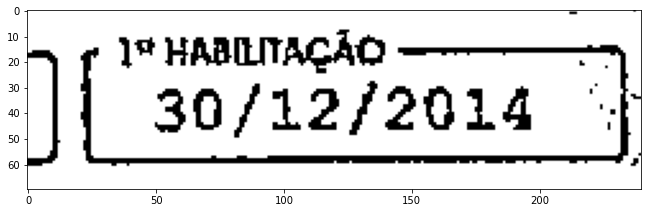

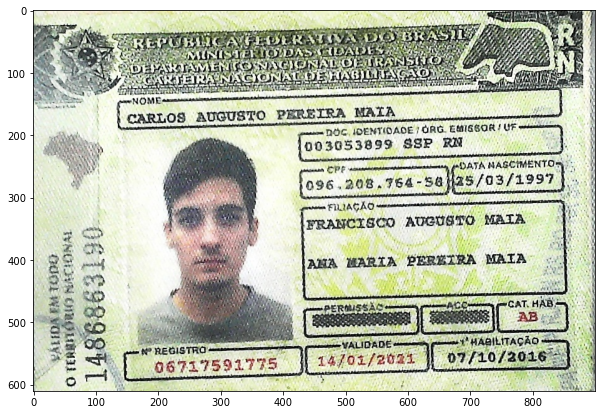


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:   CARLOS AUGUSTO PEREIRA MATA IDENTIOAO
CPF: 
Data de nascimento:  25/03/1997
Número de registro:  0 1 4
Validade: 
Primeira Habilitação:  07/10/2016


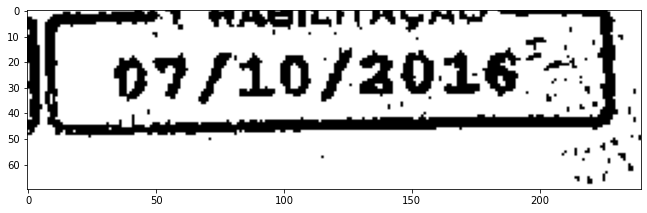


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  E RLOS AUGUSTO PERETRA
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


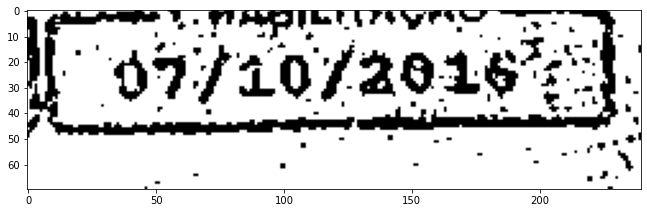


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome: 
CPF:  08 264 50 0
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


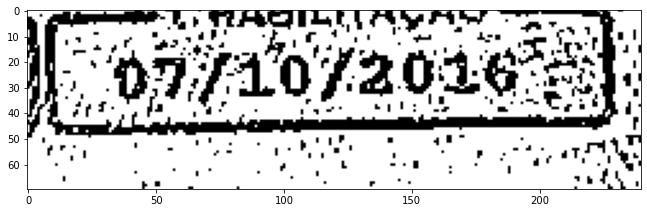

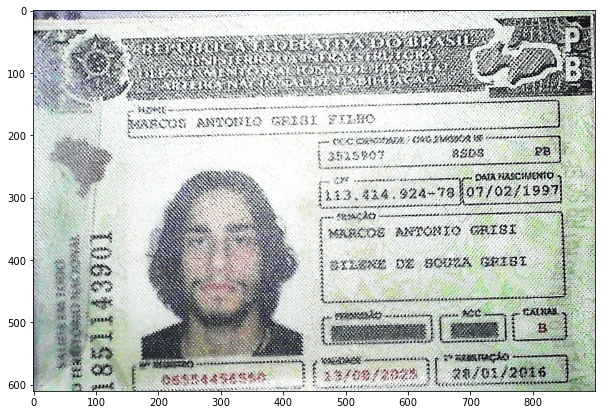


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  SSA SON ANTAL
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


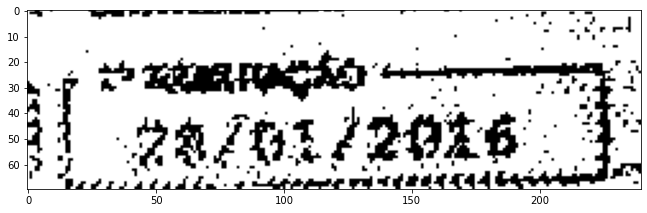


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  SATU
CPF:  924 78
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


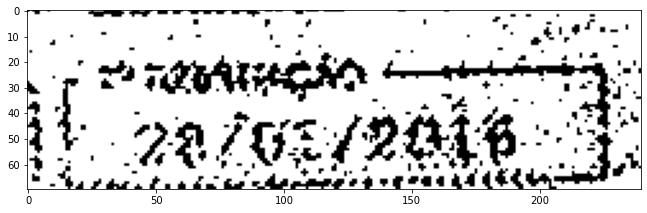


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome: 
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


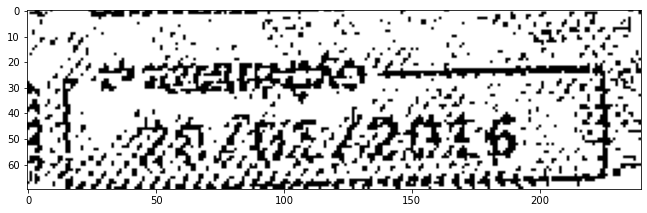

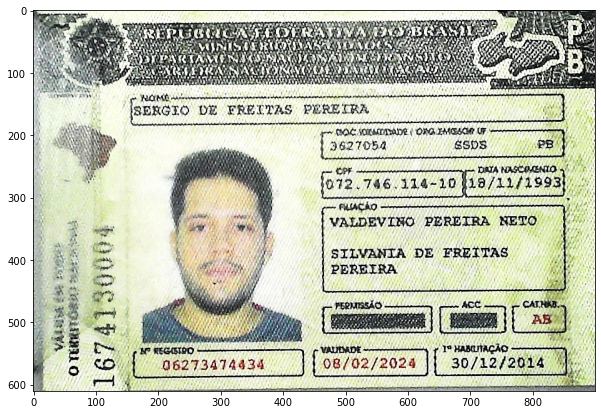


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  ORO TATA OY TL ORSOMR UIE
CPF:  72 746 424 10
Data de nascimento: 
Número de registro:  06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


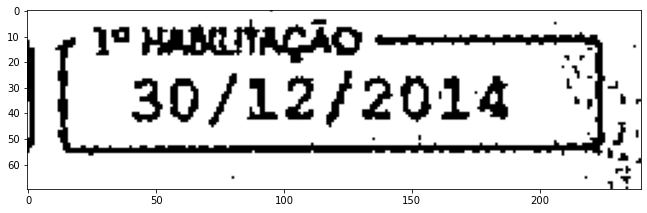


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  S RON SERGIO DE T DE TSAO UF
CPF:  972 746 316 10
Data de nascimento: 
Número de registro:  5 5 5 08273474434 4
Validade: 
Primeira Habilitação:  30/12/2944


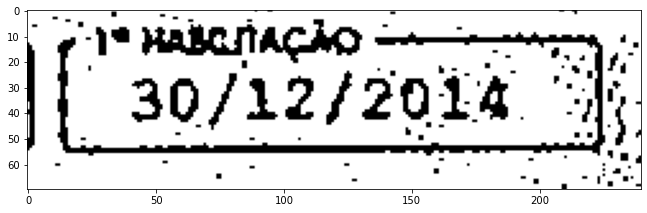


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome: 
CPF: 
Data de nascimento: 
Número de registro: 
Validade: 
Primeira Habilitação: 


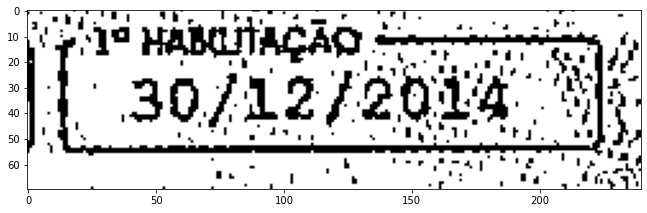

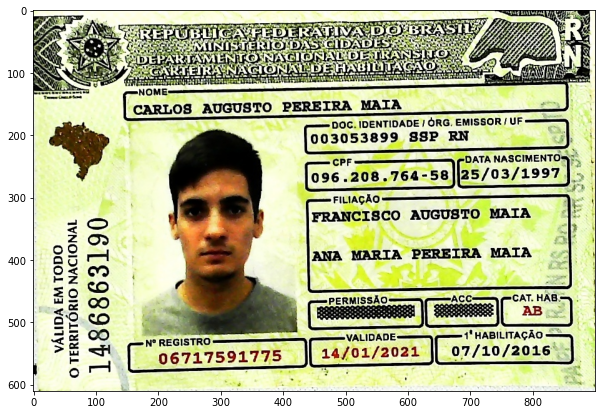


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  CARLOS AUGUSTO PEREIRA MATA ENTIDADE ORG EMISSOR UF N
CPF:  208 764 58 2
Data de nascimento:  25/03/1997
Número de registro:  06717591775
Validade:  14/01/2021
Primeira Habilitação:  07/10/2016


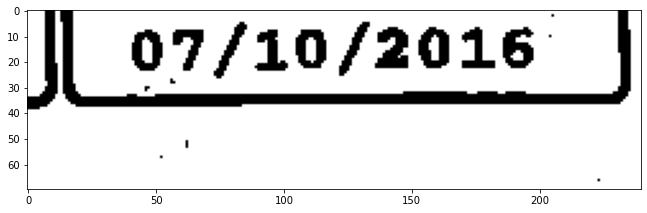


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  AE AUGUSTO PEREIRA MAIA DOC IDENTIDADE ORG EMISSOR UF
CPF:  096 208 764 58 2
Data de nascimento:  25/03/1997
Número de registro:  06717591775
Validade:  14/01/2024
Primeira Habilitação:  07/10/2016


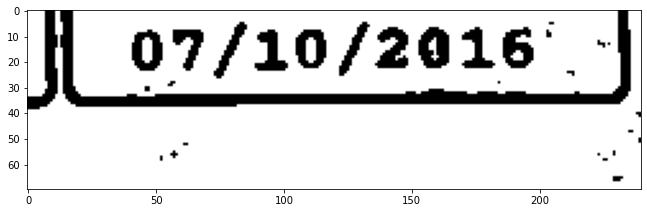


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  E CARLOS AUGUSTO PEREIRA MATA ENTIDADE ORG EMISSOR UF N
CPF:  208 764 58 2
Data de nascimento:  25/03/1997
Número de registro:  06717591775
Validade:  14/01/2021
Primeira Habilitação: 


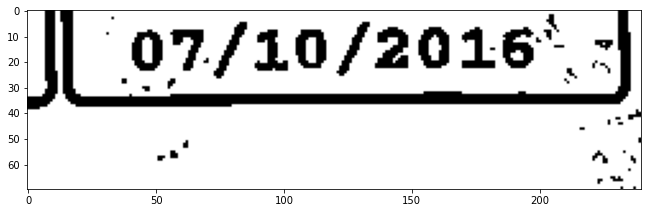

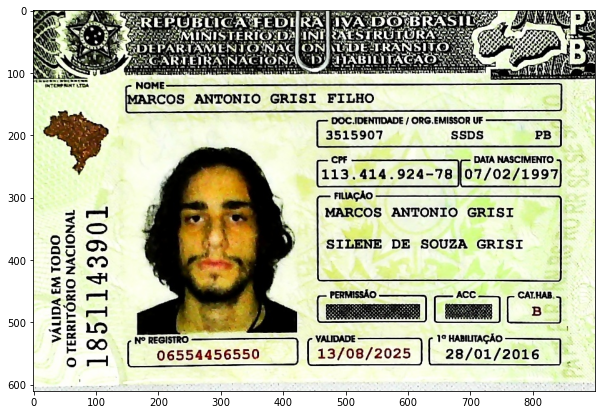


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  COS ANTONIO GRISI FILHO OOT DENTIDADE ORG EMISSOR UF
CPF:  113 414 924 78
Data de nascimento:  07/02/1997
Número de registro:  4 06554456550
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


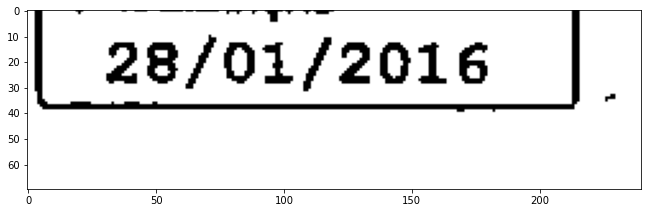


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  COS ANTONIO GRISI FILHO DOC JDENTIOADE ORG EMISSOR UF A AS
CPF:  113 414 924 78
Data de nascimento:  07/02/1997
Número de registro:  4 06554456550
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


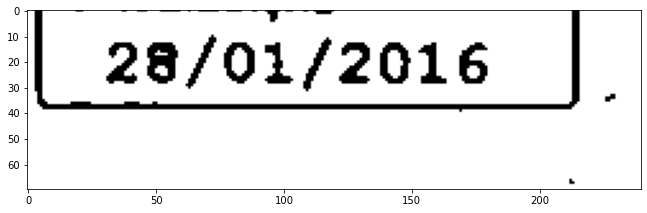


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  COS ANTONIO GRISI FILHO DOC IDENTIDADE ORG EMISSOR UF
CPF:  113 414 924 78
Data de nascimento:  07/02/1997
Número de registro:  4 06554456550
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


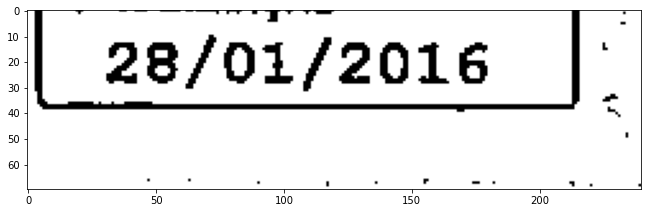

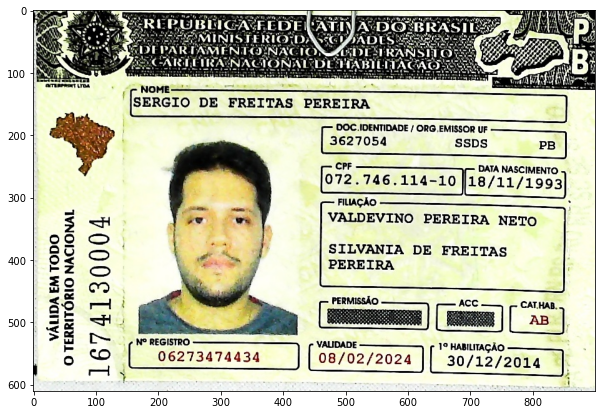


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:   SERGIO DE FREITAS PEREIRA COC IDENTINADE ORG ISSOR UF
CPF:  072 746 114 10
Data de nascimento:  18/11/1993
Número de registro:  06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


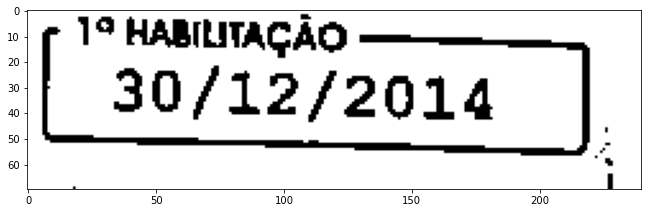


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:   SERGIO DE FREITAS PEREIRA DOC MDENTIDADE ORG EMISSOR UF
CPF:  072 746 114 10 7
Data de nascimento: 
Número de registro:  06273474434 4
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


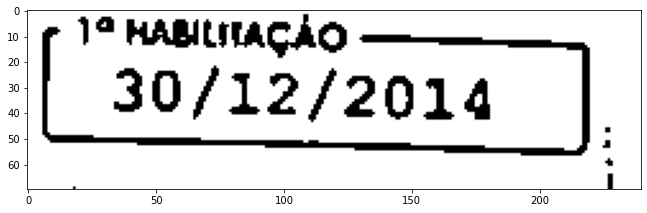


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  S  SERGIO DE FREITAS PEREIRA OOC IDENTIDADE ORG EMISSOR UF
CPF:  072 746 114 10 7
Data de nascimento:  28/21/1993
Número de registro:  06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


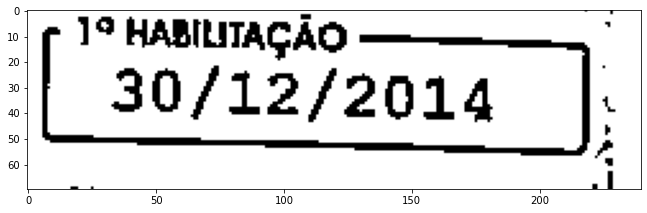

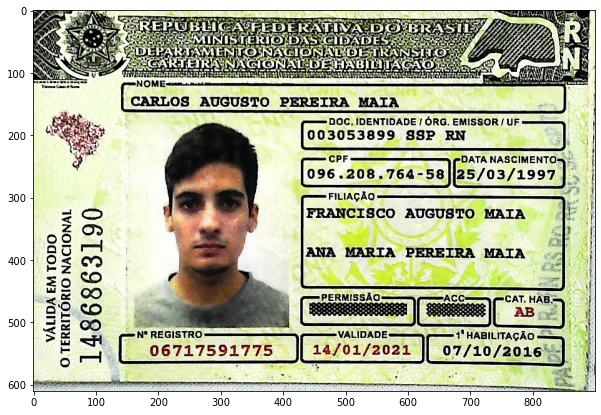


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:  AUGUSTO PEREIRA MAIA DOG IDENTIDADE ORG EMISSOR UF
CPF:  096 208 764 58
Data de nascimento:  25/03/1997
Número de registro:  06717591775
Validade:  14/01/2021
Primeira Habilitação:  07/10/2016


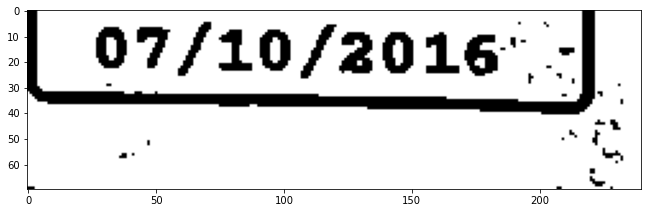


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:  CARLOS AUGUSTO PEREIRA MAIA DOC OENTIOADE ORG EMISSOR UF
CPF:  096 208 764 58 2
Data de nascimento:  25/03/1997
Número de registro:  06717591775
Validade:  24/01/2021
Primeira Habilitação:  07/10/2016


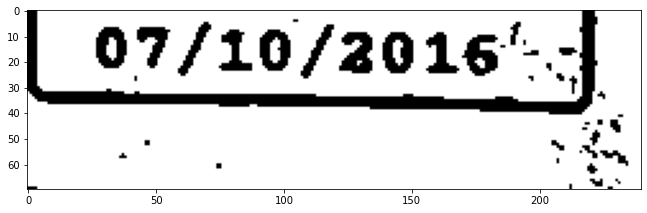


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:  CARLOS AUGUSTO PEREIRA MAIA T P DOG DENTIOADE ORG EMISSOR UF
CPF:  096 208 764 58
Data de nascimento:  25/03/1997
Número de registro: 
Validade:  14/01/2022
Primeira Habilitação: 


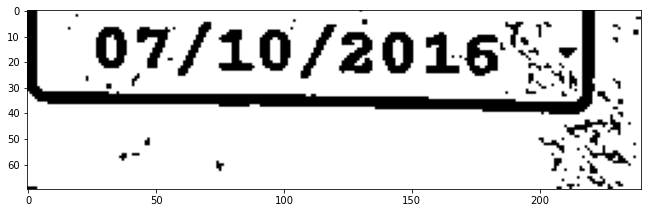

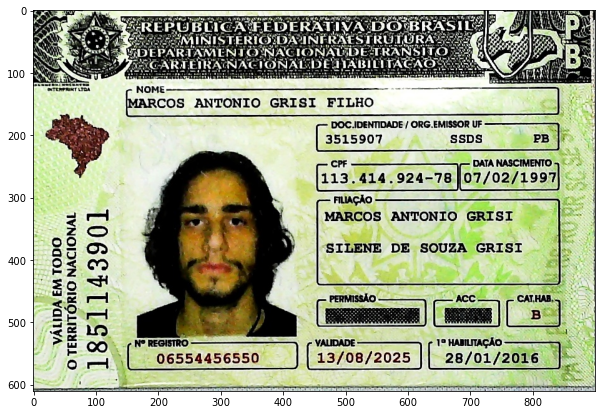


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:   COS ANTONIO GRISI FILHO DOC IDENTIDADE ORG EMISSOR UF
CPF:  213 414 924 78
Data de nascimento: 
Número de registro:  4 06554456550
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


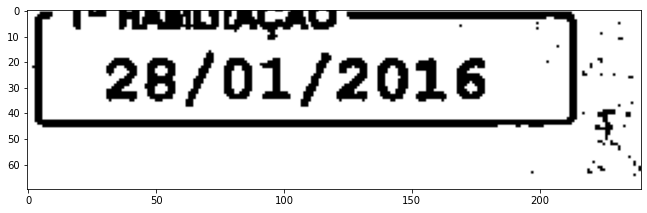


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:   COS ANTONIO GRISI FILHO DOCIOENTIDADE ORG EMISSOR UF
CPF:  213 414 924 78
Data de nascimento: 
Número de registro:  06554456550
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


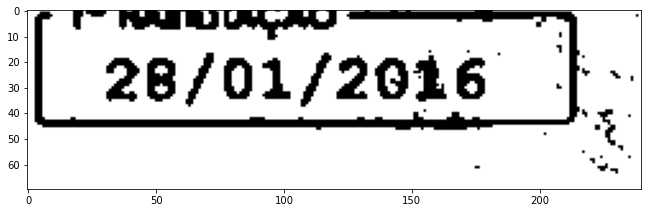


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:   COS ANTONIO GRISI FILHO T DOC IDENTIDADE ORG EMISSOR UF J
CPF:  413 414 924 78 0
Data de nascimento: 
Número de registro: 
Validade:  13/08/2025
Primeira Habilitação:  28/01/2016


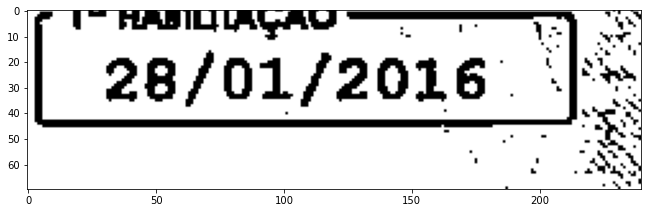

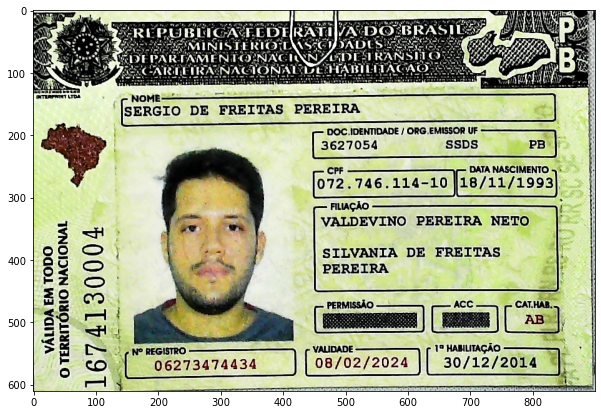


>>>>>>> SEGMENTAÇÃO 1 <<<<<<<

Nome:   ISERGIO DE FREITAS PEREIRA DOC IDENTIDADE ORG EMISSOR UF
CPF:  072 746 114 10
Data de nascimento:  18/11/1993
Número de registro:  06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


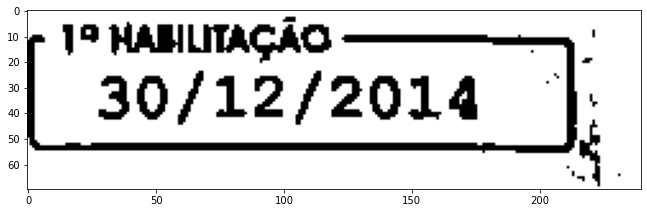


>>>>>>> SEGMENTAÇÃO 2 <<<<<<<

Nome:   ISERGIO DE FREITAS PEREIRA DOC IDENNDADE ORG EMGSOR UF
CPF:  072 746 114 10 1
Data de nascimento:  18/11/1993
Número de registro:  7 5 06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


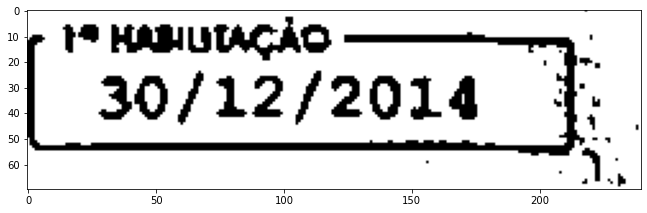


>>>>>>> SEGMENTAÇÃO 3 <<<<<<<

Nome:   ISERGIO DE FREITAS PEREIRA DOC IDENTIOADE ORG EMISSOR UF
CPF:  072 746 114 10 2
Data de nascimento:  18/11/1993
Número de registro:  06273474434
Validade:  08/02/2024
Primeira Habilitação:  30/12/2014


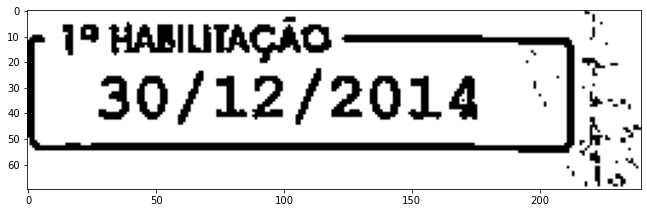

In [79]:
images = glob.glob("../teste1/alinhadas/*.jpg")

for p in images:
    
    img = cv2.imread(p)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
    
    ############ SEGMENTAÇÃO 1 #################
    print("\n>>>>>>> SEGMENTAÇÃO 1 <<<<<<<\n")
    tozero = settozero(img)
    ret,thresh = cv2.threshold(tozero,125,255,cv2.THRESH_BINARY)
    #plt.imshow(cv2.cvtColor(thresh, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    #>>>> IMAGE_TO_DATA <<<<#
    '''
    keys = data_keys(thresh)
    boxes = drawboxes(img, keys)
    #plt.imshow(cv2.cvtColor(boxes, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc, dataval, dataph = get_datas(img, keys)
    print("Data nascimento:", datanasc)
    print("Validade:", dataval)
    print("Primeira Habilitação:", dataph)
    cpf = get_cpf(img, keys)
    print("CPF:", cpf)
    '''
    
    #>>>> IMAGE_TO_STRING <<<<#
    
    nome = extraiNome(thresh)
    #plt.imshow(cv2.cvtColor(nome, cv2.COLOR_BGR2RGB))
    #plt.show()
    cpf_0 = get_cpf_roi(thresh)
    #plt.imshow(cv2.cvtColor(cpf_0, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc_0 = get_datanasc_roi(thresh)
    #plt.imshow(cv2.cvtColor(datanasc_0, cv2.COLOR_BGR2RGB))
    #plt.show()
    numreg_0 = get_nreg_roi(thresh)
    #plt.imshow(cv2.cvtColor(numreg_0, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataval_0 = get_dataval_roi(thresh)
    #plt.imshow(cv2.cvtColor(dataval_0, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataph_0 = get_primhab_roi(thresh)
    plt.imshow(cv2.cvtColor(dataph_0, cv2.COLOR_BGR2RGB))
    plt.show()
    
    ############ SEGMENTAÇÃO 2 ################
    print("\n>>>>>>> SEGMENTAÇÃO 2 <<<<<<<\n")
    nitida = sharpenFunction(img)
    filt = filterFunction(nitida)
    blur = cv2.medianBlur(filt, 3)
    #plt.imshow(cv2.cvtColor(blur, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    #>>>> IMAGE_TO_DATA <<<<#
    '''
    keys1 = data_keys(blur)
    boxes1 = drawboxes(img, keys1)
    #plt.imshow(cv2.cvtColor(boxes1, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc1, dataval1, dataph1 = get_datas(img, keys1)
    print("Data nascimento:", datanasc1)
    print("Validade:", dataval1)
    print("Primeira Habilitação:", dataph1)
    cpf1 = get_cpf(img, keys1)
    print("CPF:", cpf1)
    '''
    
    #>>>> IMAGE_TO_STRING <<<<#
    
    nome1 = extraiNome(blur)
    #plt.imshow(cv2.cvtColor(nome1, cv2.COLOR_BGR2RGB))
    #plt.show()
    cpf_1 = get_cpf_roi(blur)
    #plt.imshow(cv2.cvtColor(cpf_1, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc_1 = get_datanasc_roi(blur)
    #plt.imshow(cv2.cvtColor(datanasc_1, cv2.COLOR_BGR2RGB))
    #plt.show()
    numreg_1 = get_nreg_roi(blur)
    #plt.imshow(cv2.cvtColor(numreg_1, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataval_1 = get_dataval_roi(blur)
    #plt.imshow(cv2.cvtColor(dataval_1, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataph_1 = get_primhab_roi(blur)
    plt.imshow(cv2.cvtColor(dataph_1, cv2.COLOR_BGR2RGB))
    plt.show()
    
    ############ SEGMENTAÇÃO 3 ################
    print("\n>>>>>>> SEGMENTAÇÃO 3 <<<<<<<\n")
    bil = bilateral(img)
    thlocal = thresholdLocal(bil)
    #plt.imshow(cv2.cvtColor(thlocal, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    
    #>>>> IMAGE_TO_DATA <<<<#
    '''
    keys2 = data_keys(thlocal)
    boxes2 = drawboxes(img, keys2)
    #plt.imshow(cv2.cvtColor(boxes2, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc2, dataval2, dataph2 = get_datas(img, keys2)
    print("Data nascimento:", datanasc2)
    print("Validade:", dataval2)
    print("Primeira Habilitação:", dataph2)
    cpf2 = get_cpf(img, keys2)
    print("CPF:", cpf2)
    '''
    
    #>>>> IMAGE_TO_STRING <<<<#
    
    nome2 = extraiNome(thlocal)
    #plt.imshow(cv2.cvtColor(nome2, cv2.COLOR_BGR2RGB))
    #plt.show()
    cpf_2 = get_cpf_roi(thlocal)
    #plt.imshow(cv2.cvtColor(cpf_2, cv2.COLOR_BGR2RGB))
    #plt.show()
    datanasc_2 = get_datanasc_roi(thlocal)
    #plt.imshow(cv2.cvtColor(datanasc_2, cv2.COLOR_BGR2RGB))
    #plt.show()
    numreg_2 = get_nreg_roi(thlocal)
    #plt.imshow(cv2.cvtColor(numreg_2, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataval_2 = get_dataval_roi(thlocal)
    #plt.imshow(cv2.cvtColor(dataval_2, cv2.COLOR_BGR2RGB))
    #plt.show()
    dataph_2 = get_primhab_roi(thlocal)
    plt.imshow(cv2.cvtColor(dataph_2, cv2.COLOR_BGR2RGB))
    plt.show()
    